# ECCO SIC thickness timeseries/threshold

In [1]:
from dask_gateway import Gateway
g = Gateway()
cluster = g.connect(g.list_clusters()[0].name)
client = cluster.get_client()

In [2]:
client

Connection method: Cluster object,Cluster type: dask_gateway.GatewayCluster
Dashboard: /services/dask-gateway/clusters/prod.8f77b086730c45ceb09cb29d2f534703/status,


In [33]:
client.close()
cluster.close()

/srv/conda/envs/notebook/lib/python3.9/site-packages/dask_gateway/client.py:1014: RuntimeWarning: coroutine 'rpc.close_rpc' was never awaited
  self.scheduler_comm.close_rpc()


In [3]:
import xarray as xr
import numpy as np
import dask.array as dsa
import matplotlib.pyplot as plt
from fastjmd95 import jmd95numba
import json
import fsspec
import gcsfs
import xmitgcm
from xmitgcm.llcreader.llcmodel import faces_dataset_to_latlon
import matplotlib.ticker as mticker
import cartopy.crs as ccrs #cartopy coord ref sys
import cartopy
import cartopy.feature as cfeature
from cartopy.mpl.gridliner import LONGITUDE_FORMATTER, LATITUDE_FORMATTER

In [4]:
with open('/home/jovyan/pangeo-181919-f141378dc975.json') as token_file:
    token = json.load(token_file)
gcfs_w_token = gcsfs.GCSFileSystem(token=token)

In [5]:
ds_orig = xr.open_zarr(gcsfs.GCSFileSystem(requester_pays=True).get_mapper('pangeo-ecco-eccov4r3/eccov4r3'), consolidated=True)
ds_ll = faces_dataset_to_latlon(ds_orig)
ds_ll_drop = ds_ll.drop(['i', 'j', 'i_g', 'j_g']) #, 'k', 'k_u', 'k_l', 'k_p1'])
coords = ds_ll_drop.coords.to_dataset().reset_coords().roll(i=50, i_g=50)#(i=100, i_g=100)
ds = ds_ll_drop.reset_coords(drop=True).roll(i=50, i_g=50)#(i=100, i_g=100)

#WG boundaries (65˚W, 30˚E; 80˚S, 62˚S)
left_lon = 23 #~-64.5˚ #used to be 20
right_lon = 118 #30.5˚ #used to be 115
lower_lat = 30 #~-80˚ #used to be 38
upper_lat = 80 #-61.755745˚ instead of #79:-62.216576˚ to fill upper projection plot row
j_g_upper = 81
i_g_right = 119
i_g_left = 22

#set the boundaries
lat_range = dict(j=slice(lower_lat, upper_lat), j_g=slice(lower_lat, j_g_upper))
lon_range = dict(i=slice(left_lon, right_lon), i_g=slice(left_lon, i_g_right))

ds_wg = ds.isel(**lat_range, **lon_range)
coords_wg = coords.isel(**lat_range, **lon_range)

In [6]:
sit = xr.open_dataset('sit.nc')

In [7]:
sit.SIheff

<xarray.DataArray 'SIheff' (time: 288, j: 50, i: 95)>
[1368000 values with dtype=float32]
Coordinates:
  * time     (time) datetime64[ns] 1992-01-15 1992-02-13 ... 2015-12-14
    k        int64 ...
Dimensions without coordinates: j, i
Attributes:
    standard_name:  SIheff
    long_name:      SEAICE effective ice thickness
    units:          m

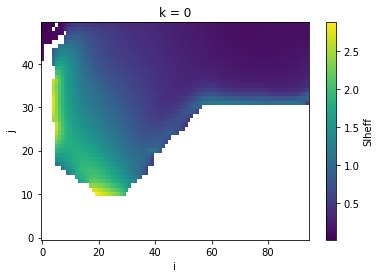

In [8]:
sit.SIheff.mean('time').plot();

In [10]:
sit_thresh = sit.SIheff.where(sit.SIheff <= 0.12)
sit_thresh

<xarray.DataArray 'SIheff' (time: 288, j: 50, i: 95)>
array([[[          nan,           nan,           nan, ...,
                   nan,           nan,           nan],
        [          nan,           nan,           nan, ...,
                   nan,           nan,           nan],
        [          nan,           nan,           nan, ...,
                   nan,           nan,           nan],
        ...,
        [0.0000000e+00, 0.0000000e+00, 0.0000000e+00, ...,
         0.0000000e+00, 0.0000000e+00, 0.0000000e+00],
        [0.0000000e+00, 0.0000000e+00, 0.0000000e+00, ...,
         0.0000000e+00, 0.0000000e+00, 0.0000000e+00],
        [0.0000000e+00, 0.0000000e+00, 0.0000000e+00, ...,
         0.0000000e+00, 0.0000000e+00, 0.0000000e+00]],

       [[          nan,           nan,           nan, ...,
                   nan,           nan,           nan],
        [          nan,           nan,           nan, ...,
                   nan,           nan,           nan],
        [          nan,           nan,           nan, ...,
                   nan,           nan,           nan],
...
        [          nan,           nan,           nan, ...,
                   nan,           nan,           nan],
        [8.2837686e-02, 1.1390087e-01,           nan, ...,
                   nan,           nan,           nan],
        [2.7824493e-02, 4.8422102e-02, 8.2027942e-02, ...,
                   nan,           nan,           nan]],

       [[          nan,           nan,           nan, ...,
                   nan,           nan,           nan],
        [          nan,           nan,           nan, ...,
                   nan,           nan,           nan],
        [          nan,           nan,           nan, ...,
                   nan,           nan,           nan],
        ...,
        [0.0000000e+00, 0.0000000e+00, 4.4996341e-05, ...,
         1.7328891e-03, 2.3307197e-03, 1.9049478e-03],
        [0.0000000e+00, 0.0000000e+00, 0.0000000e+00, ...,
         7.9718011e-04, 6.6289096e-04, 1.5773684e-04],
        [0.0000000e+00, 0.0000000e+00, 0.0000000e+00, ...,
         8.4011140e-04, 4.5364801e-04, 3.3668079e-05]]], dtype=float32)
Coordinates:
  * time     (time) datetime64[ns] 1992-01-15 1992-02-13 ... 2015-12-14
    k        int64 0
Dimensions without coordinates: j, i
Attributes:
    standard_name:  SIheff
    long_name:      SEAICE effective ice thickness
    units:          m

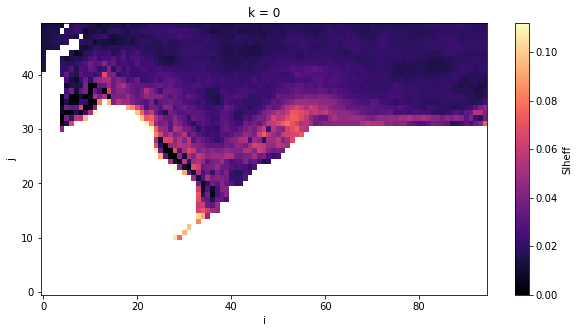

In [11]:
#look at same time as outcropping
sit_thresh.mean('time').plot(cmap='magma', figsize=(10,5));

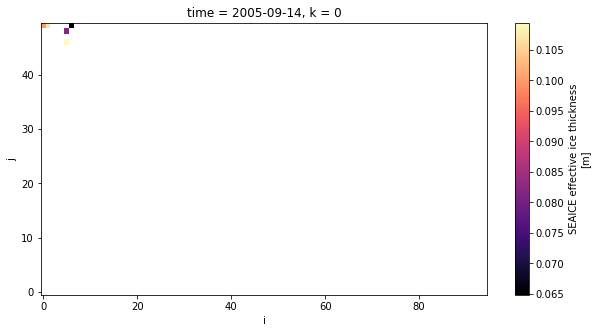

In [12]:
#look at same time as outcropping
sit_thresh.sel(time='2005-09-14', method='nearest').plot(cmap='magma', figsize=(10,5));

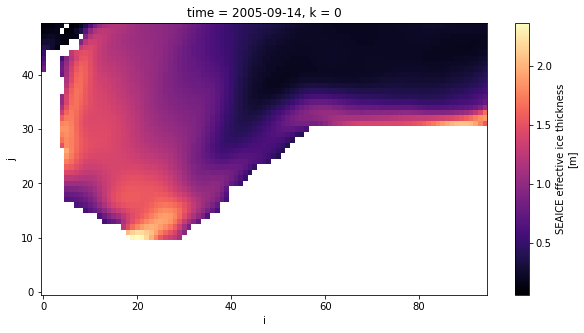

In [13]:
#look at same time as outcropping
sit.SIheff.sel(time='2005-09-14', method='nearest').plot(cmap='magma', figsize=(10,5));

In [14]:
sigma2 = xr.apply_ufunc(jmd95numba.rho, ds_wg.SALT, ds_wg.THETA, 2000,
                            output_dtypes=[ds_wg.SALT.dtype],
                            dask='parallelized').reset_coords(drop=True)

In [15]:
sigma2

,Array,Chunk
Bytes,260.93 MiB,654.30 kiB
Shape,"(288, 50, 50, 95)","(1, 50, 50, 67)"
Count,72579 Tasks,576 Chunks
Type,float32,numpy.ndarray


In [16]:
mask = coords_wg.hFacC > 0
sigma2_m = sigma2.where(mask)

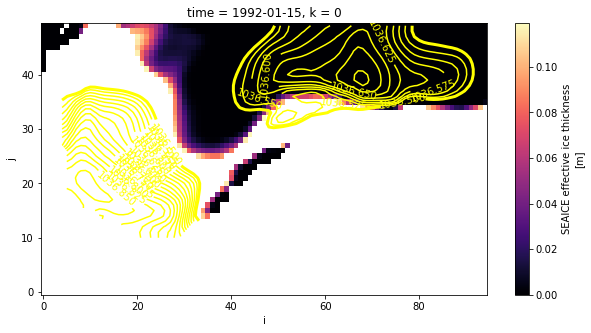

In [20]:
fig, ax = plt.subplots(figsize=(10,5))
C = sigma2_m[0, 0].plot.contour(colors='yellow', levels=np.arange(1036.5, 1037.5, 0.025), ax=ax)
# makes first contour thicker and cyan, can do for contour line dividing bottom water (index 25 w current arange)
C.collections[0].set_linewidth(3)
plt.clabel(C)
sit_thresh[0].plot(cmap='magma')

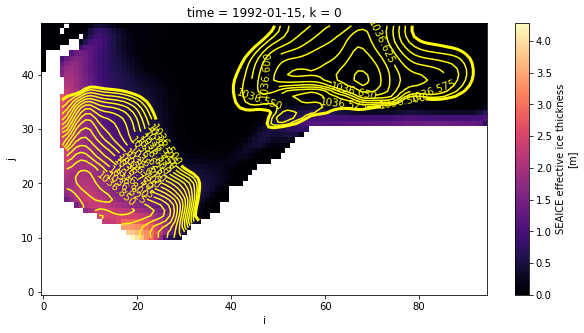

In [19]:
fig, ax = plt.subplots(figsize=(10,5))
C = sigma2_m[0, 0].plot.contour(colors='yellow', levels=np.arange(1036.5, 1037.5, 0.025), ax=ax)
# makes first contour thicker and cyan, can do for contour line dividing bottom water (index 25 w current arange)
C.collections[0].set_linewidth(3)
plt.clabel(C)
sit.SIheff[0].plot(cmap='magma')

/srv/conda/envs/notebook/lib/python3.9/site-packages/xarray/plot/plot.py:1415: UserWarning: The following kwargs were not used by contour: 'linewidth', 'label'
  primitive = ax.contour(x, y, z, **kwargs)


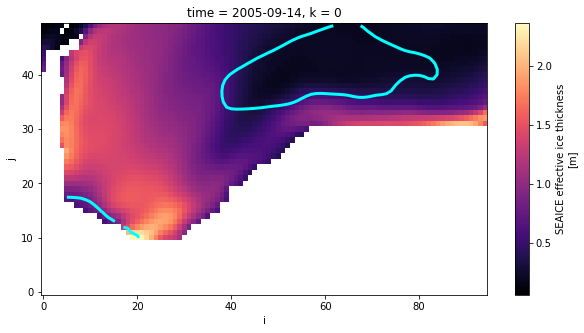

In [21]:
fig, ax = plt.subplots(figsize=(10,5))

C = sigma2_m.sel(k=0, time='2005-09-14').plot.contour(colors='cyan', levels=[1037.125], linewidth=8, label='', ax=ax)
C.collections[0].set_linewidth(3)
    
sit.SIheff.sel(time='2005-09-14').plot(cmap='magma')

In [22]:
lon = coords_wg.XC
lat = coords_wg.YC

/srv/conda/envs/notebook/lib/python3.9/site-packages/cartopy/mpl/geoaxes.py:1666: UserWarning: The following kwargs were not used by contour: 'linewidth'
  result = matplotlib.axes.Axes.contour(self, *args, **kwargs)
/srv/conda/envs/notebook/lib/python3.9/site-packages/cartopy/mpl/gridliner.py:451: UserWarning: The .xlabels_top attribute is deprecated. Please use .top_labels to toggle visibility instead.
  warnings.warn('The .xlabels_top attribute is deprecated. Please '
/srv/conda/envs/notebook/lib/python3.9/site-packages/cartopy/mpl/gridliner.py:487: UserWarning: The .ylabels_right attribute is deprecated. Please use .right_labels to toggle visibility instead.
  warnings.warn('The .ylabels_right attribute is deprecated. Please '


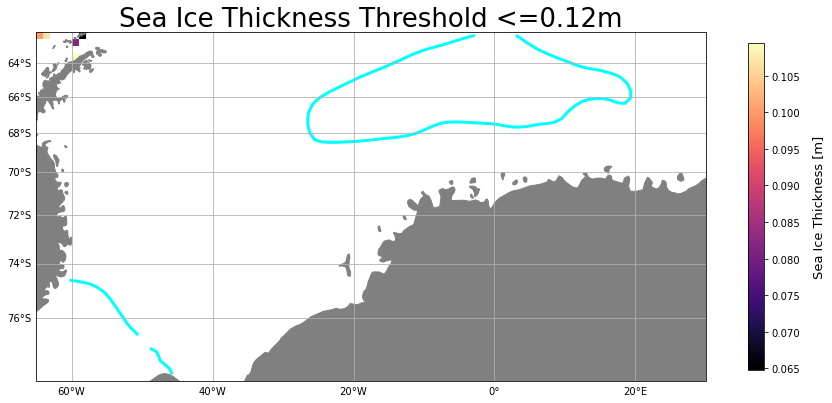

In [23]:
proj = ccrs.Mercator() #with Mercator you can put lat lon values.
fig, ax = plt.subplots(figsize=(15, 15), subplot_kw=dict(projection=proj))

ax.set_extent([-65, 30, -78, -62], crs=ccrs.PlateCarree())

ax.add_feature(cfeature.NaturalEarthFeature('physical', 'land', '50m',
                                        edgecolor='face',
                                        facecolor='0.5'))

C = ax.contour(lon, lat, sigma2_m.sel(time='2005-09-14', k=0), colors='cyan', levels=[1037.125], linewidth=8,
              transform=ccrs.PlateCarree())
C.collections[0].set_linewidth(3)

im = ax.pcolormesh(lon, lat, sit_thresh.sel(time='2005-09-14'), transform=ccrs.PlateCarree(), cmap='magma')
cb = fig.colorbar(im, ax=ax, shrink=0.4)
cb.set_label("Sea Ice Thickness [m]", labelpad=12, fontsize=13)



g1 = ax.gridlines(crs=ccrs.PlateCarree(), draw_labels=True)
g1.xlabels_top = False
g1.ylabels_right = False

plt.title('Sea Ice Thickness Threshold <=0.12m', fontsize=26);

In [73]:
def contour_sit(da, fig, tt, *args, **kwargs):
    
    proj = ccrs.Mercator() #with Mercator you can put lat lon values
    fig, ax = plt.subplots(figsize=(15,15), subplot_kw=dict(projection=proj))
    
    ax.set_extent([-65, 30, -78, -62], crs=ccrs.PlateCarree())
    
    ax.add_feature(cfeature.NaturalEarthFeature('physical', 'land', '50m',
                                        edgecolor='face',
                                        facecolor='0.5'))
    
    C = ax.contour(lon, lat, sigma2_m.isel(time=tt, k=0), colors='cyan', 
                   levels=[1037.125], linewidth=8, transform=ccrs.PlateCarree())
    #C.collections[0].set_linewidth(3)
    
    #sit = da.isel(time=tt).plot(cmap=plt.get_cmap('magma'), ax=ax)
    
    sit = ax.pcolormesh(lon, lat, da.isel(time=tt), transform=ccrs.PlateCarree(), cmap='magma')
    
    cb = fig.colorbar(sit, ax=ax, shrink=0.4)
    cb.set_label("Sea Ice Thickness Threshold <=0.12m", labelpad=12, fontsize=13)
    g1 = ax.gridlines(crs=ccrs.PlateCarree(), draw_labels=True)
    g1.xlabels_top = False
    g1.ylabels_right = False
    date = str(da.time.isel(time=tt).dt.strftime('%Y-%m-%d').values)
    ax.set_title(date, fontsize=26);
    
    return ax, sit

/srv/conda/envs/notebook/lib/python3.9/site-packages/cartopy/mpl/geoaxes.py:1666: UserWarning: The following kwargs were not used by contour: 'linewidth'
  result = matplotlib.axes.Axes.contour(self, *args, **kwargs)
/srv/conda/envs/notebook/lib/python3.9/site-packages/cartopy/mpl/gridliner.py:451: UserWarning: The .xlabels_top attribute is deprecated. Please use .top_labels to toggle visibility instead.
  warnings.warn('The .xlabels_top attribute is deprecated. Please '
/srv/conda/envs/notebook/lib/python3.9/site-packages/cartopy/mpl/gridliner.py:487: UserWarning: The .ylabels_right attribute is deprecated. Please use .right_labels to toggle visibility instead.
  warnings.warn('The .ylabels_right attribute is deprecated. Please '


(<GeoAxesSubplot:title={'center':'2005-09-14'}>,
 <cartopy.mpl.geocollection.GeoQuadMesh at 0x7f9c1267a1c0>)

<Figure size 1080x1080 with 0 Axes>

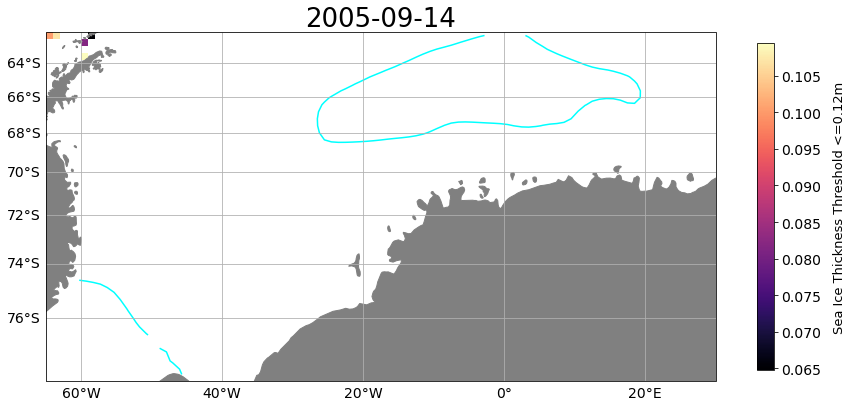

In [74]:
fig = plt.figure(figsize=(15,15))

contour_sit(sit_thresh, fig, 164)

## Movie

In [26]:
import xarray as xr
from xmovie import Movie

/srv/conda/envs/notebook/lib/python3.9/site-packages/cartopy/mpl/geoaxes.py:1666: UserWarning: No contour levels were found within the data range.
  result = matplotlib.axes.Axes.contour(self, *args, **kwargs)
/srv/conda/envs/notebook/lib/python3.9/site-packages/cartopy/mpl/geoaxes.py:1666: UserWarning: The following kwargs were not used by contour: 'linewidth'
  result = matplotlib.axes.Axes.contour(self, *args, **kwargs)
/srv/conda/envs/notebook/lib/python3.9/site-packages/cartopy/mpl/gridliner.py:451: UserWarning: The .xlabels_top attribute is deprecated. Please use .top_labels to toggle visibility instead.
  warnings.warn('The .xlabels_top attribute is deprecated. Please '
/srv/conda/envs/notebook/lib/python3.9/site-packages/cartopy/mpl/gridliner.py:487: UserWarning: The .ylabels_right attribute is deprecated. Please use .right_labels to toggle visibility instead.
  warnings.warn('The .ylabels_right attribute is deprecated. Please '


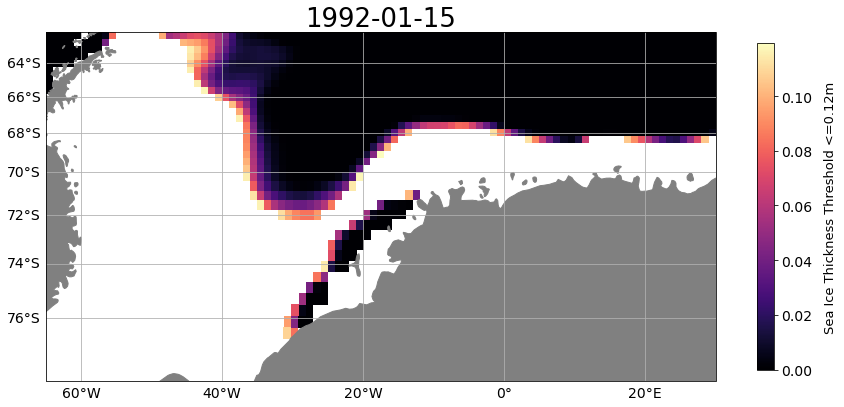

In [75]:
sit_movie = Movie(sit_thresh, contour_sit, 
                   input_check=False)

/srv/conda/envs/notebook/lib/python3.9/site-packages/cartopy/mpl/geoaxes.py:1666: UserWarning: The following kwargs were not used by contour: 'linewidth'
  result = matplotlib.axes.Axes.contour(self, *args, **kwargs)
/srv/conda/envs/notebook/lib/python3.9/site-packages/cartopy/mpl/gridliner.py:451: UserWarning: The .xlabels_top attribute is deprecated. Please use .top_labels to toggle visibility instead.
  warnings.warn('The .xlabels_top attribute is deprecated. Please '
/srv/conda/envs/notebook/lib/python3.9/site-packages/cartopy/mpl/gridliner.py:487: UserWarning: The .ylabels_right attribute is deprecated. Please use .right_labels to toggle visibility instead.
  warnings.warn('The .ylabels_right attribute is deprecated. Please '


<Figure size 1920x1080 with 0 Axes>

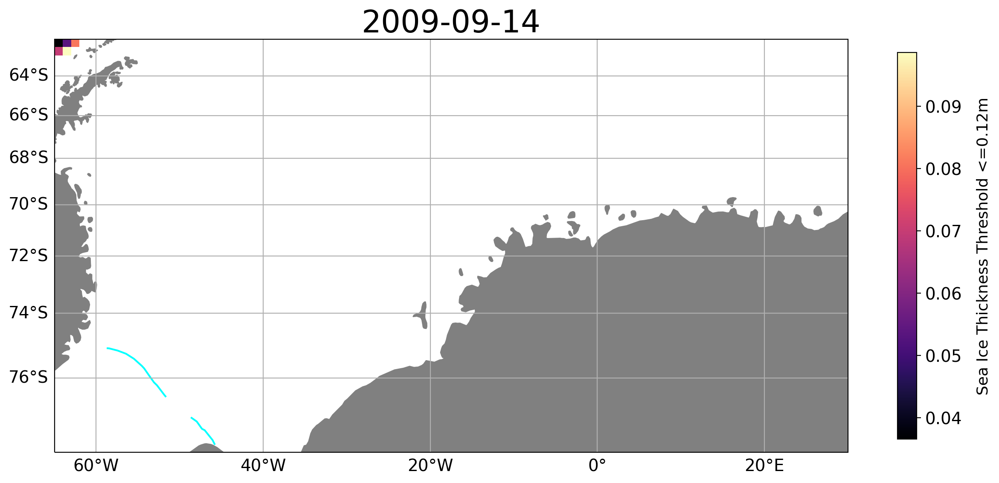

In [80]:
sit_movie.preview(212)

In [84]:
import warnings
warnings.filterwarnings("ignore")

  0%|          | 0/288 [00:00<?, ?it/s]

Movie created at SIT_threshold_ECCOmovie.mp4


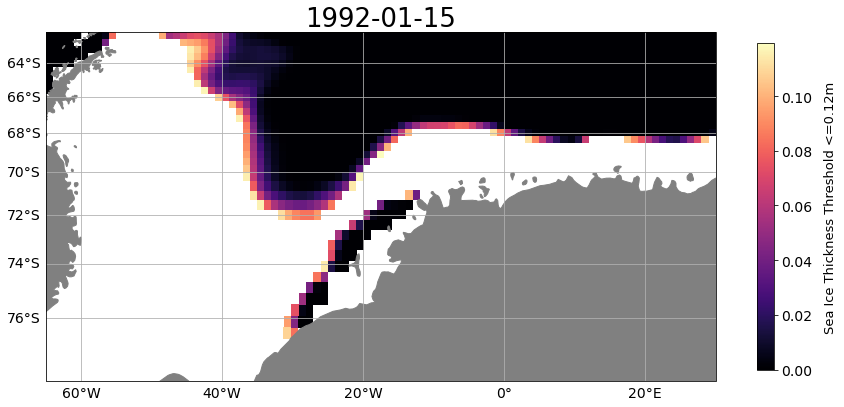

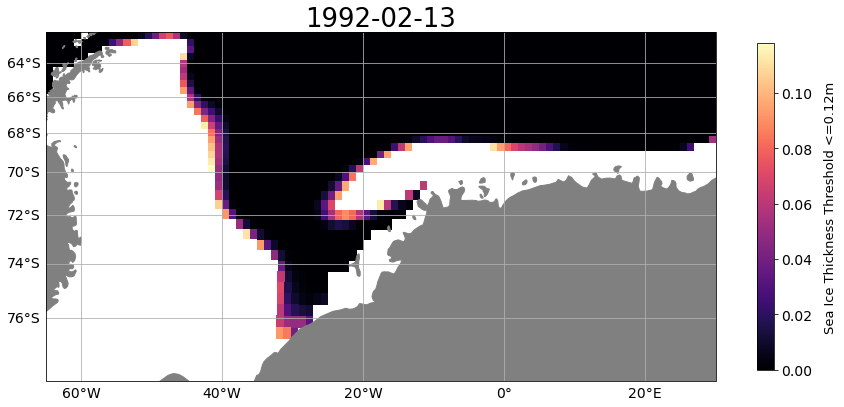

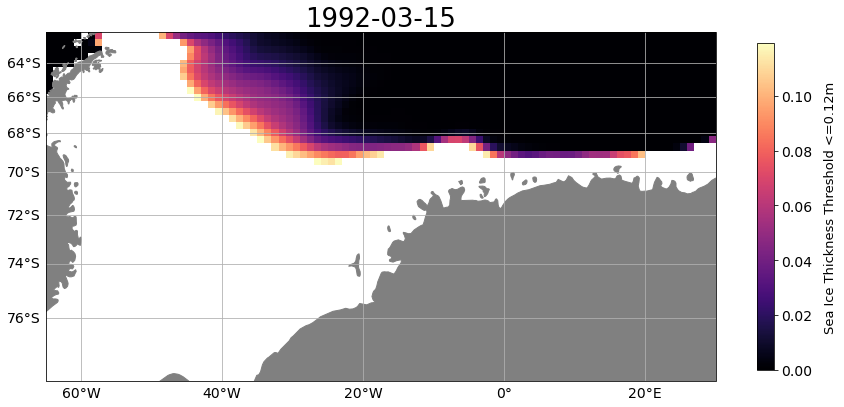

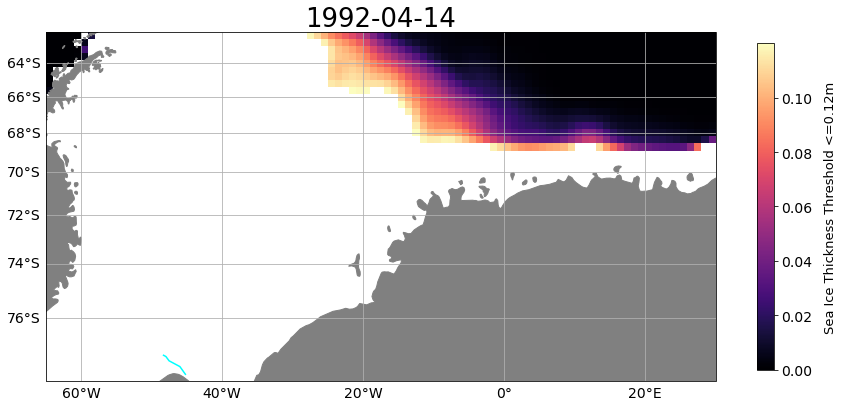

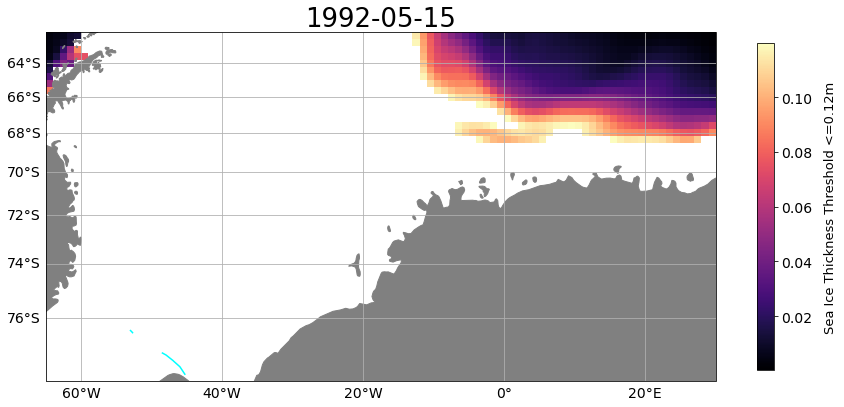

...

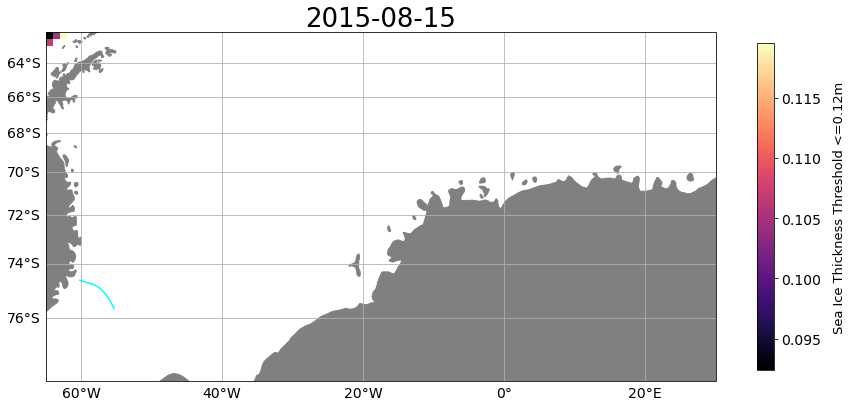

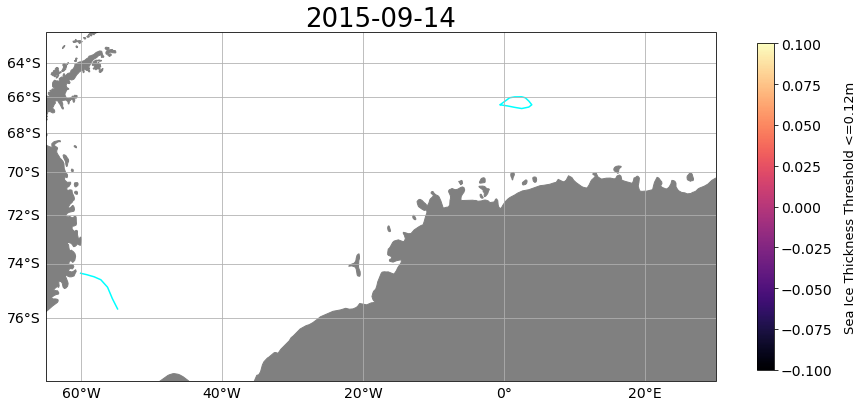

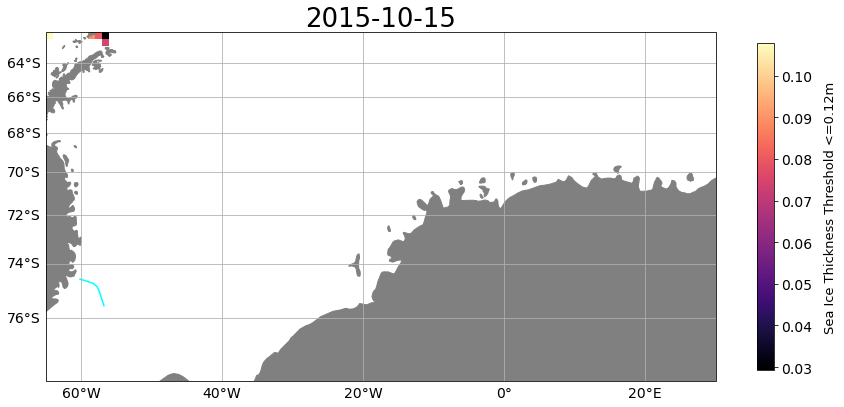

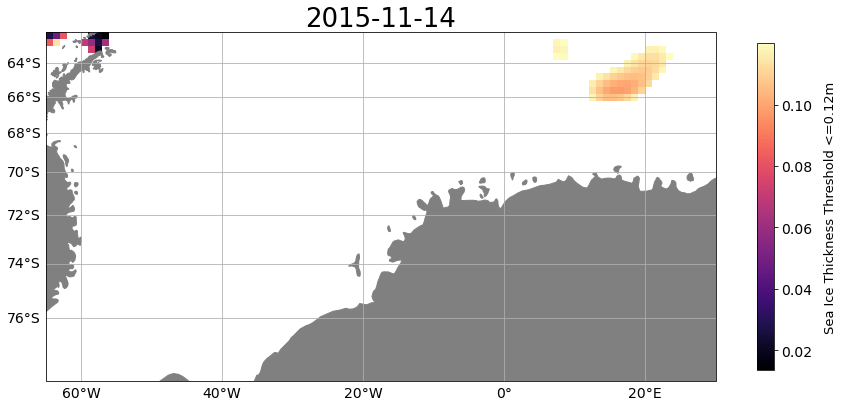

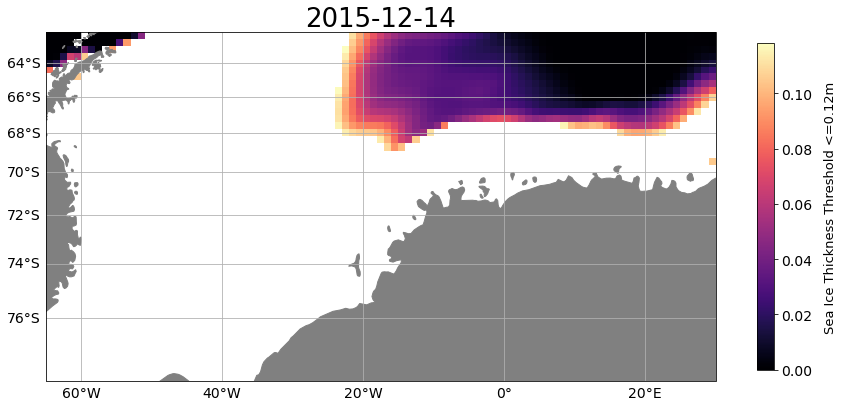

In [85]:
#save sea ice thickness movie
sit_movie.save('SIT_threshold_ECCOmovie.mp4', progress=True, overwrite_existing=True)